# Paper Extension on HW3 CNN
The goal here is to first apply saliency mapping to the CNN applied to Pneumonia images. From there we will partition the Pneumonia images to further refine the saliency mapping.

# **Note that the Overview through Step 4 are all the original homework assignment and are largely unchanged**

Uncomment and run the cell after this to export the Notebook to GitHub, otherwise comment the following cell before running to generate the interactive images

GitHub does not appear to like the widget metadata generated for the interactive images with the sliders. You get this error: "Invalid Notebook
There was an error rendering your Notebook: the 'state' key is missing from 'metadata.widgets'. Add 'state' to each, or remove 'metadata.widgets'.
Using nbformat v5.10.4 and nbconvert v7.16.6"

In [ ]:
# from ipywidgets import widgets

# from IPython.display import display

# # Disable widget state saving
# from IPython import get_ipython
# ipython = get_ipython()
# ipython.display_pub.publish = lambda *args, **kwargs: None

# HW3 Convolutional Neural Network

## Overview

In this homework, you will get introduced to CNN. More specifically, you will try CNN on X-Ray images.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

DRIVE_FILE_PATH = "/content/drive/MyDrive/Colab Notebooks/DLH Paper Replication/CNN (Pneumonia)"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import random
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import time
from tqdm import tqdm

# record start time
_START_RUNTIME = time.time()

# set seed
seed = 24
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
os.environ["PYTHONHASHSEED"] = str(seed)

# Define data and weight path
DATA_PATH = "../HW3_CNN-lib/data"
WEIGHT_PATH = "../HW3_CNN-lib/resnet18_weights_9.pth"

## About Raw Data

Pneumonia is a lung disease characterized by inflammation of the airspaces in the lungs, most commonly due to an infection. In this section, you will train a CNN model to classify Pneumonia disease (Pneumonia/Normal) based on chest X-Ray images.

The chest X-ray images (anterior-posterior) were selected from retrospective cohorts of pediatric patients of one to five years old. All chest X-ray imaging was performed as part of patients’ routine clinical care. You can refer to this [link](https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5) for more information.

In [ ]:
DATA_PATH = str(DRIVE_FILE_PATH + "/HW3_CNN-lib/data")
WEIGHT_PATH = str(DRIVE_FILE_PATH + "/HW3_CNN-lib/resnet18_weights_9.pth")
# These variables are left-over from the homework assignment and are not used here

## 1 Load and Visualize the Data [20 points]

The data is under `DATA_PATH`. In this part, you are required to load the data into the data loader, and calculate some statistics.

In [ ]:
#input
# folder: str, 'train', 'val', or 'test'
#output
# number_normal: number of normal samples in the given folder
# number_pneumonia: number of pneumonia samples in the given folder
def get_count_metrics(folder, data_path=DATA_PATH):

    '''
    TODO: Implement this function to return the number of normal and pneumonia samples.
          Hint: !ls $DATA_PATH
    '''

#     !ls -l $DATA_PATH
#     files = os.listdir(str(DATA_PATH + "/" + folder))
    folder_path_normal = str(data_path + "/" + folder + "/NORMAL")
    folder_path_pneumonia = str(data_path + "/" + folder + "/PNEUMONIA")
#     print(files)

    number_normal = 0
    number_pneumonia = 0

    print(folder_path_normal)
    print(folder_path_pneumonia)

    files_normal = os.listdir(folder_path_normal)
    files_pneumonia = os.listdir(folder_path_pneumonia)

    number_normal = len(files_normal)
    number_pneumonia = len(files_pneumonia)
    print(number_normal)
    print(number_pneumonia)

    return number_normal, number_pneumonia


#output
# train_loader: train data loader (type: torch.utils.data.DataLoader)
# val_loader: val data loader (type: torch.utils.data.DataLoader)
def load_data(data_path=DATA_PATH):

    '''
    TODO: Implement this function to return the data loader for
    train and validation dataset. Set batchsize to 32.

    You should add the following transforms (https://pytorch.org/vision/stable/transforms.html):
        1. transforms.RandomResizedCrop: the images should be cropped to 224 x 224
        2. transforms.ToTensor: just to convert data/labels to tensors
    You should set the *shuffle* flag for *train_loader* to be True, and False for *val_loader*.

    HINT: Consider using `torchvision.datasets.ImageFolder`.
    '''

    import torchvision
    import torchvision.datasets as datasets
    import torchvision.transforms as transforms


    folder_path_normal_tr = str(data_path + "/" + "train")
#     folder_path_pneumonia_tr = str(DATA_PATH + "/" + "train" + "/PNEUMONIA")
    folder_path_normal_tst = str(data_path + "/" + "val")
#     folder_path_pneumonia_tst = str(DATA_PATH + "/" + "val" + "/PNEUMONIA")

    transform_image = transforms.Compose([
        transforms.RandomResizedCrop(size=224),
        transforms.ToTensor(),
    ])

    train_normal_dataset = datasets.ImageFolder(folder_path_normal_tr, transform=transform_image)
#     train_pneumonia_dataset = datasets.ImageFolder(folder_path_pneumonia_tr, transform=transform_image)
#     train_dataset_full = ConcatDataset([train_normal_dataset, train_pneumonia_dataset])

    test_normal_dataset = datasets.ImageFolder(folder_path_normal_tst, transform=transform_image)
#     test_pneumonia_dataset = datasets.ImageFolder(folder_path_pneumonia_tst, transform=transform_image)
#     test_dataset_full = ConcatDataset([test_normal_dataset, test_pneumonia_dataset])

    train_loader = torch.utils.data.dataloader.DataLoader(train_normal_dataset, batch_size=32, shuffle=True)
    val_loader = torch.utils.data.dataloader.DataLoader(test_normal_dataset, batch_size=32, shuffle=False)

    return train_loader, val_loader

In [ ]:
import os

cwd = os.getcwd()
print(os.getcwd())
folders = [f for f in os.listdir(cwd) if os.path.isdir(os.path.join(cwd, f))]
print("Folders:")
for folder in folders:
    print("-", folder)

print("/content/drive/MyDrive/Colab Notebooks/DLH Paper Replication/CNN (Pneumonia)/HW3_CNN-lib/data/train/NORMAL")

/content
Folders:
- .config
- drive
- sample_data
/content/drive/MyDrive/Colab Notebooks/DLH Paper Replication/CNN (Pneumonia)/HW3_CNN-lib/data/train/NORMAL


In [ ]:
'''
AUTOGRADER CELL. DO NOT MODIFY THIS.
'''

assert type(get_count_metrics('train')) is tuple
assert type(get_count_metrics('val')) is tuple

assert get_count_metrics('train') == (335, 387)
assert get_count_metrics('val') == (64, 87)



/content/drive/MyDrive/Colab Notebooks/DLH Paper Replication/CNN (Pneumonia)/HW3_CNN-lib/data/train/NORMAL
/content/drive/MyDrive/Colab Notebooks/DLH Paper Replication/CNN (Pneumonia)/HW3_CNN-lib/data/train/PNEUMONIA
335
387
/content/drive/MyDrive/Colab Notebooks/DLH Paper Replication/CNN (Pneumonia)/HW3_CNN-lib/data/val/NORMAL
/content/drive/MyDrive/Colab Notebooks/DLH Paper Replication/CNN (Pneumonia)/HW3_CNN-lib/data/val/PNEUMONIA
64
87
/content/drive/MyDrive/Colab Notebooks/DLH Paper Replication/CNN (Pneumonia)/HW3_CNN-lib/data/train/NORMAL
/content/drive/MyDrive/Colab Notebooks/DLH Paper Replication/CNN (Pneumonia)/HW3_CNN-lib/data/train/PNEUMONIA
335
387
/content/drive/MyDrive/Colab Notebooks/DLH Paper Replication/CNN (Pneumonia)/HW3_CNN-lib/data/val/NORMAL
/content/drive/MyDrive/Colab Notebooks/DLH Paper Replication/CNN (Pneumonia)/HW3_CNN-lib/data/val/PNEUMONIA
64
87


In [ ]:
'''
AUTOGRADER CELL. DO NOT MODIFY THIS.
'''

train_loader, val_loader = load_data()

assert type(train_loader) is torch.utils.data.dataloader.DataLoader

assert len(train_loader) == 23


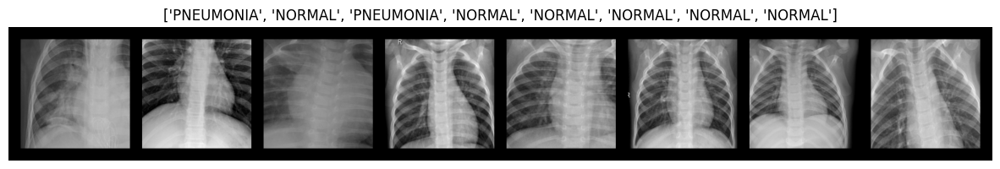

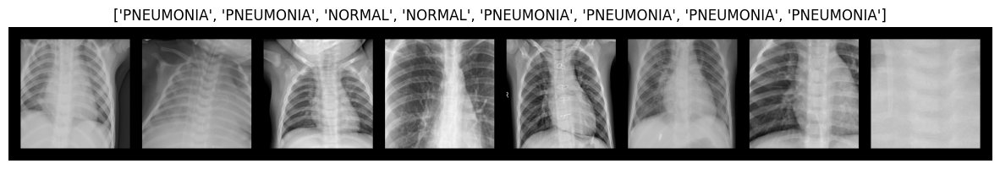

In [ ]:
# DO NOT MODIFY THIS PART


import torchvision
import matplotlib.pyplot as plt

def imshow(img, title):
    npimg = img.numpy()
    plt.figure(figsize=(15, 7))
    plt.axis('off')
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title(title)
    plt.show()

def show_batch_images(dataloader, k=8):
    images, labels = next(iter(dataloader))
    images = images[:k]
    labels = labels[:k]
    img = torchvision.utils.make_grid(images, padding=25)
    imshow(img, title=["NORMAL" if x==0  else "PNEUMONIA" for x in labels])

train_loader, val_loader = load_data()
for i in range(2):
    show_batch_images(train_loader)

## 2 Build the Model [35 points]

This time, you will define a CNN architecture. Instead of an MLP, which used linear, fully-connected layers, you will use the following:
- [Convolutional layers](https://pytorch.org/docs/stable/nn.html#conv2d), which can be thought of as stack of filtered images.
- [Maxpooling layers](https://pytorch.org/docs/stable/nn.html#maxpool2d), which reduce the x-y size of an input, keeping only the most active pixels from the previous layer.
- The usual Linear + Dropout layers to avoid overfitting and produce a 2-dim output.

Below is a typical CNN architicture which consists of \[INPUT - CONV - RELU - POOL - FC\] layers.

<img src=./img/convnet.jpg>

### 2.1 Convolutional Layer Output Volume [10 points]
Before we get started, let us do a warm-up question.

Calculate the output volume for a convolutional layer: given the input volume size $W$, the kernel/filter size $F$, the stride $S$, and the amount of zero padding $P$ used on the border, calculate the output volume size.

In [ ]:
def conv_output_volume(W, F, S, P):

    """
    TODO: Given the input volume size $W$, the kernel/filter size $F$,
    the stride $S$, and the amount of zero padding $P$ used on the border,
    calculate the output volume size.
    Note the output should a integer.
    """
    volume = (W - F + 2 * P) / S + 1
    return int(volume // 1)

In [ ]:
'''
AUTOGRADER CELL. DO NOT MODIFY THIS.
'''

assert conv_output_volume(W=7, F=3, S=1, P=0) == 5
assert conv_output_volume(W=7, F=3, S=2, P=0) == 3
assert conv_output_volume(W=8, F=3, S=2, P=0) == 3



### 2.2 Define CNN [15 points]
Now, define your own CNN model below. Note that, the more convolutional layers you include, the more complex patterns the model can detect. For now, it is suggested that your final model include 2 or 3 convolutional layers as well as linear layers + dropout in between to avoid overfitting.

It is also a good practice to look at existing research and implementations of related models as a starting point for defining your own models. You may find it useful to look at this [PyTorch classification example](https://github.com/pytorch/tutorials/blob/master/beginner_source/blitz/cifar10_tutorial.py).

Please do not use the same model structure as in Section 2.3. Specifically, let's define a small model with less than 10 layers/modules (must be fewer than 20).

In [ ]:
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        conv_output = conv_output_volume(32, 3, 1, 0)
#         print(conv_output)
        self.conv1 = nn.Conv2d(3, 16, 3)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, 3)
        self.lin1 = nn.Linear(32 * 54 * 54, 256)
        self.lin2 = nn.Linear(256, 128)
        self.lin3 = nn.Linear(128, 2)

        # UNIQUE RELUs (do NOT reuse)
        self.relu1 = nn.ReLU()
        self.relu2 = nn.ReLU()
        self.relu3 = nn.ReLU()
        self.relu4 = nn.ReLU()
        self.dropout = nn.Dropout(p=0.5)

    def forward(self, x):
        #input is of shape (batch_size=32, 3, 224, 224) if you did the dataloader right
#         print(x.size())
        x = self.pool(self.relu1(self.conv1(x)))
        x = self.pool(self.relu2(self.conv2(x)))
#         print("Shape: ", x.shape)
        x = torch.flatten(x, start_dim=1)
#         print("Flat Shape: ", x.shape)
        x = self.relu3(self.lin1(x))
        x = self.dropout(x)
        x = self.relu4(self.lin2(x))
        x = self.lin3(x)

        return x

In [ ]:
simple_model = SimpleCNN()
simple_model_size = sum([param.nelement() * param.element_size() for param in simple_model.parameters()]) / 1e9
print('SimpleCNN size in GB:', simple_model_size)
assert simple_model_size <= 1, 'SimpleCNN is too large! Please minimize the number of parameters.'

SimpleCNN size in GB: 0.09570548


In [ ]:
'''
AUTOGRADER CELL. DO NOT MODIFY THIS.
'''
simple_model = SimpleCNN()

assert issubclass(type(simple_model), nn.Module), "Your CNN model should be a torch.nn.Module instance."
assert len(list(simple_model.modules())) < 20, "Your CNN model is too big. Please re-design."

test_input = torch.zeros(32, 3, 224, 224)
test_output = simple_model(test_input)
assert test_output.shape == torch.Size([32,2]), "Your CNN model has a wrong output size."



### 2.3 Using Predefined CNN Model [10 points]
In this section, we will import a predefined CNN, the ResNet18 model, which is pretty successful in many image classification tasks. We will modify the last layer to use it on our binary classification problem, but keep the rest of the structure the same

In [ ]:
#output
# model: the cnn model
def get_cnn_model():

    """
    TODO: Define the CNN model here.
        We will use a ResNet18 model.
        For now, please set `pretrained=False`. We will manually load the weights later.
        Then, replace the last layer (model.fc) with a nn.Linear layer
            The new model.fc should have the same input size but a new output_size of 2
    """

    from torchvision import models

    num_classes = 2
    resNet18_model = models.resnet18(pretrained=False)
    resNet18_model.fc = nn.Linear(in_features=resNet18_model.fc.in_features, out_features=num_classes)

    model = resNet18_model

    #For computation efficiency, we will freeze the weights in the bottom layers
    for param in model.named_parameters():
        if param[0].split(".")[0] == 'fc':
            continue
        param[1].requires_grad = False
    return model

In [ ]:
'''
AUTOGRADER CELL. DO NOT MODIFY THIS.
'''

assert issubclass(type(get_cnn_model()), nn.Module), "Your CNN model should be a torch.nn.Module instance"
model = get_cnn_model()
assert len(list(model.modules())) == 68, "# of modules mismtach - Please use ResNet18"
assert len(list(model.parameters())) == 62, "# of parameter tensors mismtach - different model. Please use ResNet18"



/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


## 3 Training the Network [25 points]

Due to the computation environment constraint, we will load some pre-trained weights instead of training everything from scratch.

In [ ]:
model = get_cnn_model()
#Load the pretrained weights
#If it fails, it probably means you did not define the model correctly
model.load_state_dict(torch.load(WEIGHT_PATH, map_location='cpu'))

<All keys matched successfully>

### 3.1 Criterion and Opimizer [10 points]
In this part, you will define the loss and optimizer for the model and then perform model training.

In [ ]:
"""
TODO: Specify loss function (CrossEntropyLoss) and assign it to `criterion`.
Spcify optimizer (SGD) and assign it to `optimizer`.
Hint: the learning rate is usually a small number on the scale of 1e-4 ~ 1e-2
"""
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)


In [ ]:
'''
AUTOGRADER CELL. DO NOT MODIFY THIS.
'''

assert isinstance(criterion, torch.nn.modules.loss.CrossEntropyLoss)
assert isinstance(optimizer, torch.optim.SGD)



### 3.2 Training [15 points]

Now let us train the CNN model we previously created.

Remember that from the previous HW, to train the model, you should follow the following step:
- Clear the gradients of all optimized variables
- Forward pass: compute predicted outputs by passing inputs to the model
- Calculate the loss
- Backward pass: compute gradient of the loss with respect to model parameters
- Perform a single optimization step (parameter update)
- Update average training loss


In [ ]:
# number of epochs to train the model
# make sure your model finish training within 4 minutes on a CPU machine
# You can experiment different numbers for n_epochs, but even 1 epoch should be good enough.
n_epochs = 1

def train_model(model, train_dataloader, n_epoch=n_epochs, optimizer=optimizer, criterion=criterion):
    import torch.optim as optim
    """
    :param model: A CNN model
    :param train_dataloader: the DataLoader of the training data
    :param n_epoch: number of epochs to train
    :return:
        model: trained model
    """
    model.train() # prep model for training


    for epoch in range(n_epoch):
        curr_epoch_loss = []
        for data, target in tqdm(train_dataloader):
            """
            TODO: Within the loop, do the normal training procedures:
                   pass the input through the model
                   pass the output through loss_func to compute the loss (name the variable as *loss*)
                   zero out currently accumulated gradient, use loss.basckward to backprop the gradients, then call optimizer.step
            """
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, target)
            loss.backward()
            optimizer.step()
            curr_epoch_loss.append(loss.cpu().data.numpy())
        print(f"Epoch {epoch}: curr_epoch_loss={np.mean(curr_epoch_loss)}")
    return model

In [ ]:
# get train and val data loader
train_loader, val_loader = load_data()

seed = 24
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

model = train_model(model, train_loader)

100%|██████████| 23/23 [01:37<00:00,  4.23s/it]

Epoch 0: curr_epoch_loss=0.19598303735256195


## 4 Test the Trained Network [20 points]

In this step, you will test your model on the validation data and evaluate its performance.

In [ ]:
def eval_model(model, dataloader):
    """
    :return:
        Y_pred: prediction of model on the dataloder. Should be an numpy array of ints
        Y_true: truth labels. Should be an numpy array of ints
    TODO:
        evaluate the model using on the data in the dataloder.
        Add all the prediction and truth to the corresponding list
        Convert Y_pred and Y_true to numpy arrays (of shape (n_data_points,))
    """
    model.eval()
    Y_pred = []
    Y_true = []
    for data, target in dataloader:
        outputs = model(data)
        _, predicted = torch.max(outputs, 1)
        Y_pred.append(predicted.numpy())
        Y_true.append(target.numpy())

    Y_pred = np.concatenate(Y_pred, axis=0)
    Y_true = np.concatenate(Y_true, axis=0)

    return Y_pred, Y_true

In [ ]:
'''
AUTOGRADER CELL. DO NOT MODIFY THIS.
'''
from sklearn.metrics import accuracy_score

y_pred, y_true = eval_model(model, val_loader)
acc = accuracy_score(y_true, y_pred)
print(("Validation Accuracy: " + str(acc)))
assert acc > 0.7, "Validation Accuracy below 0.7 for validation data!"
assert len(y_true) == len(y_pred) == 151, "Output size is wrong"



Validation Accuracy: 0.8609271523178808


In [ ]:
#As noted before, please make sure the whole notebook does not exceed 4 mins on a CPU
print("Total running time = {:.2f} seconds".format(time.time() - _START_RUNTIME))

Total running time = 135.88 seconds


# 5 Apply Saliency Techniques to Sample Images

Here as described in the paper we start by applying basic saliency mapping
techniques to our CNN to generate visuals as to what our CNN is actually looking
at.

We will add the following saliency techniques for singular images and then
expand for several images in later sections.

Let's look at a reasonably clear sample image.

In [ ]:
def imshow2(img, title):
    # %matplotlib inline
    npimg = img.detach().numpy()
    plt.figure(figsize=(15, 7))
    plt.axis('off')
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title(title)
    plt.show()

def show_batch_images_no_label(dataloader, k=8, label="PNEUMONIA"):
    images = next(iter(dataloader))
    images = images[:k]
    img = torchvision.utils.make_grid(images, padding=25)
    imshow2(img, title=label)

def imshowSaliencyComp(img, saliency, title, thresholdPercent=90):
    # %matplotlib inline
    npimg = img.detach().numpy()
    # Normalize saliency
    saliency_squeeze = saliency.squeeze().detach().cpu().numpy()
    saliency_norm = (saliency_squeeze - np.min(saliency_squeeze)) / (np.max(saliency_squeeze) - np.min(saliency_squeeze) + 1e-8)

    # Set a threshold to mask low saliency values
    threshold = np.percentile(saliency_norm, thresholdPercent)
    alpha_mask = np.where(saliency_norm > threshold, saliency_norm, 0)

    saliency_masked = np.where(saliency_norm > threshold, saliency_norm, np.nan)

    plt.figure(figsize=(15, 7))
    plt.axis('off')
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.imshow(saliency_masked, cmap='hot', alpha=alpha_mask)
    plt.title(title)
    plt.show()

def show_batch_images_single_saliency(dataloader, salImg, k=8, label="PNEUMONIA", thresholdPercent=90):
    images = next(iter(dataloader))
    images = images[:k]
    img = torchvision.utils.make_grid(images, padding=25)
    # salImg_grid = torchvision.utils.make_grid(salImg, padding=25)
    imshowSaliencyComp(img, salImg, title=label, thresholdPercent=thresholdPercent)

In [ ]:
from PIL import Image
import torchvision.transforms as transforms

# sampleImageName = str("person10_bacteria_43.jpeg")
# sampleImageName = str("person172_bacteria_827.jpeg")
sampleImageName = str("person16_virus_47.jpeg")
# sampleImageName = str("NORMAL2-IM-1018-0001.jpeg")
folder_path_pneumonia_tr = str(DATA_PATH + "/" + "train" + "/PNEUMONIA")
folder_path_saliency_collection_pn = str(DATA_PATH + "/" + "saliency" + "/PNEUMONIA")
folder_path_saliency_collection_norm = str(DATA_PATH + "/" + "saliency" + "/NORMAL")
# sampleImagePath = str(folder_path_pneumonia_tr + "/" + sampleImageName)
sampleImagePath = str(folder_path_saliency_collection_pn + "/" + sampleImageName)
img = Image.open(sampleImagePath)
transform = transforms.ToTensor()

img_tensor=transform(img)

img_tensor.requires_grad_()

tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.0118, 0.0118, 0.0078],
         [0.0000, 0.0000, 0.0000,  ..., 0.0118, 0.0118, 0.0078],
         [0.0000, 0.0000, 0.0000,  ..., 0.0118, 0.0118, 0.0078]]],
       requires_grad=True)

Redefine some drawing functions to work with our saliency maps and handle the "requires_grad" property.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from skimage.transform import resize
import ipywidgets as widgets
from IPython.display import display

def show_saliency_with_slider(image, saliency, title, gradientInd, img_count, labels):
    # Prepare data
    if gradientInd == 0:
      npimg = image.detach().cpu().numpy()
      npimg = np.transpose(npimg, (1, 2, 0))
      if isinstance(saliency, torch.Tensor):
          saliency_np = saliency.squeeze().detach().cpu().numpy()
      elif isinstance(saliency, np.ndarray):
          saliency_np = np.squeeze(saliency)
      else:
          raise TypeError(f"Expected saliency to be torch.Tensor or np.ndarray but got {type(saliency)}")

      if saliency_np.ndim == 3 and saliency_np.shape[0] in [1, 3]:  # (C, H, W)
        saliency_np = np.transpose(saliency_np, (1, 2, 0))  # (H, W, C)
        if saliency_np.shape[2] > 1:
            saliency_np = saliency_np.mean(axis=-1)  # (H, W)

      saliency_norm = (saliency_np - np.min(saliency_np)) / (np.max(saliency_np) - np.min(saliency_np) + 1e-8)
    elif gradientInd == 1:
      image = image.detach().cpu().clone()
      npimg = image.permute(1, 2, 0).numpy()
      # npimg = image.detach().cpu().numpy()
      # npimg = np.transpose(npimg, (1, 2, 0))
      npimg = np.clip(npimg, 0, 1)
      # saliency_norm = resize(saliency, npimg.shape[:2], preserve_range=True, anti_aliasing=True)
      # print("image shape:", npimg.shape)
      # print("saliency shape:", saliency_norm.shape)
      saliency_np = saliency

      # Handle different saliency shapes
      if saliency_np.ndim == 3 and saliency_np.shape[0] in [1, 3]:  # (C, H, W)
          saliency_np = np.transpose(saliency_np, (1, 2, 0))  # (H, W, C)
          if saliency_np.shape[2] > 1:
              saliency_np = saliency_np.mean(axis=-1)  # (H, W)

      elif saliency_np.ndim == 2:
          pass  # already (H, W)

      else:
          raise ValueError(f"Unexpected saliency shape: {saliency_np.shape}")

      saliency_np = np.nan_to_num(saliency_np, nan=0.0)

      # Normalize saliency
      saliency_min = saliency_np.min()
      saliency_max = saliency_np.max()
      if saliency_max - saliency_min < 1e-8:
          saliency_norm = np.zeros_like(saliency_np)
      else:
          saliency_norm = (saliency_np - saliency_min) / (saliency_max - saliency_min + 1e-8)

      # Resize if necessary
      if saliency_norm.shape != npimg.shape[:2]:
          saliency_norm = resize(saliency_norm, npimg.shape[:2], preserve_range=True, anti_aliasing=True)

      print("image shape:", npimg.shape)
      print("saliency shape:", saliency_norm.shape)
    elif gradientInd == 2:
      image = image.detach().cpu()
      npimg = image.permute(1, 2, 0).numpy()
      npimg = np.clip(npimg, 0, 1)

      # Normalize saliency
      saliency_np = saliency.squeeze()
      if saliency_np.ndim == 3:
          saliency_np = saliency_np.mean(axis=0)  # reduce to 2D
      saliency_norm = (saliency_np - saliency_np.min()) / (saliency_np.max() - saliency_np.min() + 1e-8)

      # Replace NaNs with 0 before normalization
      saliency_np = np.nan_to_num(saliency_np, nan=0.0)

      # Normalize safely
      saliency_min = saliency_np.min()
      saliency_max = saliency_np.max()
      if saliency_max - saliency_min < 1e-8:
          saliency_norm = np.zeros_like(saliency_np)  # avoid divide by zero
      else:
          saliency_norm = (saliency_np - saliency_min) / (saliency_max - saliency_min)

      # Resize saliency to match image
      if saliency_norm.shape != npimg.shape[:2]:
          saliency_norm = resize(saliency_norm, npimg.shape[:2], preserve_range=True, anti_aliasing=True)

      print("image shape:", npimg.shape)
      print("saliency shape:", saliency_norm.shape)

    def plot_overlay(alpha):
        if img_count == 1:
          plt.figure(figsize=(6, 6))
        else:
          plt.figure(figsize=(3 * img_count, 12))
        plt.imshow(npimg)
        plt.imshow(saliency_norm, cmap='hot', alpha=alpha)
        if len(labels) > 1:
          new_title = ["NORMAL" if x==0  else "PNEUMONIA" for x in labels]
        else:
          new_title = title
        plt.title(f"{new_title} (Alpha = {alpha:.2f})")
        plt.axis('off')
        plt.show()

    slider = widgets.FloatSlider(value=0.3, min=0.0, max=1.0, step=0.01, description='Alpha', continuous_update=False)
    # display(widgets.interact(plot_overlay, alpha=slider))
    # Connect slider to output
    out = widgets.interactive_output(plot_overlay, {'alpha': slider})

    # Display
    display(slider, out)

def show_single_image_saliency_with_slider(dataloader, salImg, k=8, label="PNEUMONIA", gradientInd=0):
    images = next(iter(dataloader))
    images = images[:k]
    img = torchvision.utils.make_grid(images, padding=25)
    labels = [""]
    show_saliency_with_slider(img, salImg, title=label, gradientInd=gradientInd, img_count=1, labels=labels)

def show_batch_images_saliency_with_slider(dataloader, salImg, k=8, label="PNEUMONIA", gradientInd=0, img_count=1):
    images, labels = next(iter(dataloader))
    images = images[:k]
    labels = labels[:k]
    img = torchvision.utils.make_grid(images, padding=25, normalize=True)
    # salImg_tensor = torch.stack(salImg[:k])
    # First ensure everything is a tensor
     # Stack saliency safely
    salImg_tensor = torch.stack([
        torch.from_numpy(s).unsqueeze(0) if isinstance(s, np.ndarray) else s.unsqueeze(0)
        for s in salImg[:k]
    ])  # Now shape (B, 1, H, W)

    if gradientInd == 1:
        # === Normalize saliency tensor batch-wide ===
        salImg_tensor = salImg_tensor - salImg_tensor.min()
        salImg_tensor = salImg_tensor / (salImg_tensor.max() + 1e-8)

    salImg_grid = torchvision.utils.make_grid(salImg_tensor, padding=25, normalize=True)
    show_saliency_with_slider(img, salImg_grid, title=label, gradientInd=gradientInd, img_count=len(images), labels=labels)

def show_single_matched_image_saliency_with_slider(found_list, index=0, k=8, label="PNEUMONIA", gradientInd=0):
    # found_list[index] = (salImg, (images, labels))
    salImg, (images, labels) = found_list[index]

    # Limit to first k images
    images = images[:k]
    if labels is not None:
        labels = labels[:k]
    else:
        labels = [""] * k

    # Make a grid of the images
    img = torchvision.utils.make_grid(images, padding=25)

    # Prepare labels (optional, you can customize if you want real label names)
    label_names = [str(l.item()) if isinstance(l, torch.Tensor) else str(l) for l in labels]

    # Display using your visualization function
    show_saliency_with_slider(
        img,
        salImg,
        title=label,
        gradientInd=gradientInd,
        img_count=k,
        labels=label_names
    )

def show_single_image_from_batch_saliency_with_slider(found_list, batch_index=0, image_index=0, label="PNEUMONIA", gradientInd=0):
    # Correct unpacking: each found_list entry is a (saliency_maps, (images, labels)) tuple
    saliency_maps, (images, labels) = found_list[batch_index]

    # Select the specific image and corresponding saliency map
    image = images[image_index]
    saliency = saliency_maps[image_index]
    label = labels[image_index]
    print(labels)

    # Make the image a grid (even though it’s just one image, for consistency)
    img = torchvision.utils.make_grid(image.unsqueeze(0), padding=25)
    img = (img - img.min()) / (img.max() - img.min())

    # Prepare labels
    if labels is not None:
        label_text = str(labels[image_index].item()) if isinstance(labels[image_index], torch.Tensor) else str(labels[image_index])
    else:
        label_text = ""

    label_value = "NORMAL";
    if label == 1:
      label_value = "PNEUMONIA"

    # Show
    show_saliency_with_slider(
        img,
        saliency,
        title=f"{label_value}: {label_text}",
        gradientInd=gradientInd,
        img_count=1,
        labels=[label_text]
    )

def show_batch_images_saliency_with_slider_lrp(dataloader, salImg, k=8, label="PNEUMONIA", gradientInd=0, img_count=1):
    images, labels = next(iter(dataloader))
    images = images[:k]
    labels = labels[:k]
    # Make sure saliency maps are resized to the same size as images first
    resized_sal_maps = []
    for idx in range(len(images)):
        img_h, img_w = images[idx].shape[1], images[idx].shape[2]
        sal = salImg[idx]
        if isinstance(sal, np.ndarray):
            sal_resized = resize(sal, (img_h, img_w), preserve_range=True, anti_aliasing=True)
            sal_resized = torch.from_numpy(sal_resized).float()
        else:
            sal_resized = F.interpolate(sal.unsqueeze(0), size=(img_h, img_w), mode='bilinear', align_corners=False).squeeze(0)
        resized_sal_maps.append(sal_resized)

    salImg_tensor = torch.stack([s.unsqueeze(0) if s.ndim == 2 else s for s in resized_sal_maps])  # (B, 1, H, W)

    # Create grid same way as image grid
    img_grid = torchvision.utils.make_grid(images, padding=25, normalize=True)
    sal_grid = torchvision.utils.make_grid(salImg_tensor, padding=25, normalize=True)

    show_saliency_with_slider(
        img_grid,
        sal_grid,
        title=label,
        gradientInd=gradientInd,
        img_count=len(images),
        labels=labels
    )

def show_single_image_from_batch_saliency_with_slider_lrp(found_list, batch_index=0, image_index=0, label="PNEUMONIA", gradientInd=0):
    # Correct unpacking: each found_list entry is a (saliency_maps, (images, labels)) tuple
    saliency_maps, (images, labels) = found_list[batch_index]
    print(len(saliency_maps))
    print(len(images))
    print(len(labels))

    # Select the specific image and corresponding saliency map
    image = images[image_index]
    saliency = saliency_maps[image_index]
    label = labels[image_index]
    print(labels)
    print(len(saliency_maps[0]))

    # Make the image a grid (even though it’s just one image, for consistency)
    img = torchvision.utils.make_grid(image.unsqueeze(0), padding=25)
    img = (img - img.min()) / (img.max() - img.min())

    # Prepare labels
    if labels is not None:
        label_text = str(labels[image_index].item()) if isinstance(labels[image_index], torch.Tensor) else str(labels[image_index])
    else:
        label_text = ""

    label_value = "NORMAL";
    if label == 1:
      label_value = "PNEUMONIA"

    # Show
    show_saliency_with_slider(
        img,
        saliency,
        title=f"{label_value}: {label_text}",
        gradientInd=gradientInd,
        img_count=1,
        labels=[label_text]
    )


In [ ]:
#output
# saliency_loader: saliency data loader (type: torch.utils.data.DataLoader)
def load_data_sal(data_path=DATA_PATH):

    '''
    You should add the following transforms (https://pytorch.org/vision/stable/transforms.html):
        1. transforms.RandomResizedCrop: the images should be cropped to 224 x 224
        2. transforms.ToTensor: just to convert data/labels to tensors
    '''

    import torchvision
    import torchvision.datasets as datasets
    import torchvision.transforms as transforms


    folder_path_normal_sal = str(data_path + "/" + "saliency")

    transform_image = transforms.Compose([
        transforms.RandomResizedCrop(size=224),
        transforms.ToTensor(),
    ])

    sal_dataset = datasets.ImageFolder(folder_path_normal_sal, transform=transform_image)

    sal_loader = torch.utils.data.dataloader.DataLoader(sal_dataset, batch_size=10, shuffle=False)

    return sal_loader

<Figure size 640x480 with 0 Axes>

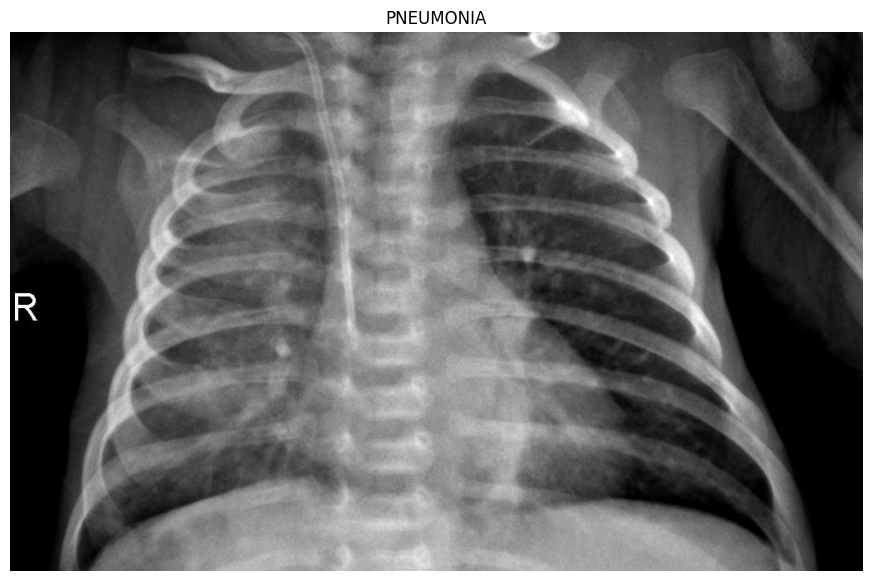

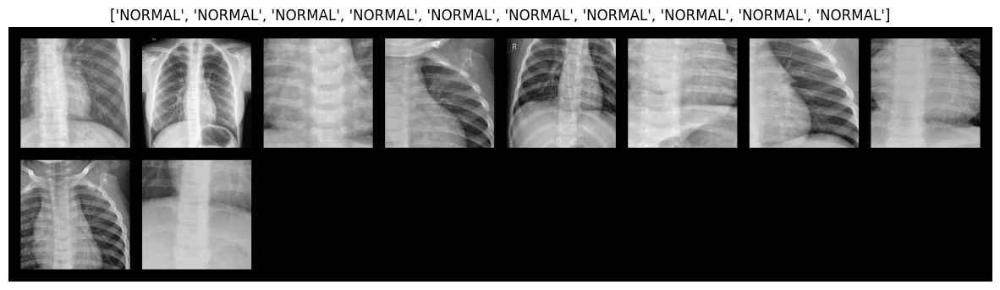

In [ ]:
from torch.utils.data import Dataset, DataLoader

class SingleImageDataset(Dataset):
    def __init__(self, image_path, transform=None):
        self.image_path = image_path
        self.transform = transform

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        image = Image.open(self.image_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
            image.requires_grad_()
        return image


transform_image = transforms.Compose([
        transforms.RandomResizedCrop(size=224),
        transforms.ToTensor(),
    ])
sampleGradientImageDataset = SingleImageDataset(sampleImagePath, transform=transform)
sampleGradientImageDataloader = DataLoader(sampleGradientImageDataset, batch_size=1, shuffle=False)
salDataLoader = load_data_sal()

plt.clf()
show_batch_images_no_label(sampleGradientImageDataloader, 1)
# print(salDataLoader)
show_batch_images(salDataLoader, 10)

# 5.1 Gradient Mapping
To start with let's try a gradient saliency map

In [ ]:
def gradient_saliency_mapping_single(model, sampleDataLoader):
  model.eval()
  saliency = []
  for batch in sampleDataLoader:
      batch = batch.detach()
      batch.requires_grad_()
      output = model(batch)  # batch shape: [1, C, H, W]
      # print(output)
      # print(batch.requires_grad)
                # shape: [1, num_classes]
      target_class = output.argmax(dim=1)   # or set manually like target_class = torch.tensor([5])
      score = output[0, target_class]

      model.zero_grad()
      score.backward()

      sal = batch.grad.abs()  # shape: [1, C, H, W]
      sal, _ = torch.max(sal, dim=1)  # reduce across color channels, shape: [1, H, W]
      saliency.append(sal)
  return saliency

def gradient_saliency_mapping(model, sampleDataLoader):
  model.eval()
  saliency = []
  for inputs in sampleDataLoader:
      if isinstance(inputs, (tuple, list)):
          batch = inputs[0]  # first element assumed to be the image tensor
      else:
          batch = inputs

      batch = batch.detach()
      batch.requires_grad_()
      output = model(batch)  # batch shape: [1, C, H, W]
      # print(output)
      # print(batch.requires_grad)
                # shape: [1, num_classes]
      target_class = output.argmax(dim=1)   # or set manually like target_class = torch.tensor([5])
      scores = output.gather(1, target_class.unsqueeze(1)).squeeze()  # shape [B]

      model.zero_grad()
      scores.sum().backward()  # sum() so backward() gets a scalar

      sal = batch.grad.abs()  # shape: [1, C, H, W]
      sal, _ = torch.max(sal, dim=1)  # reduce across color channels, shape: [1, H, W]

      saliency.extend(sal)
  return saliency

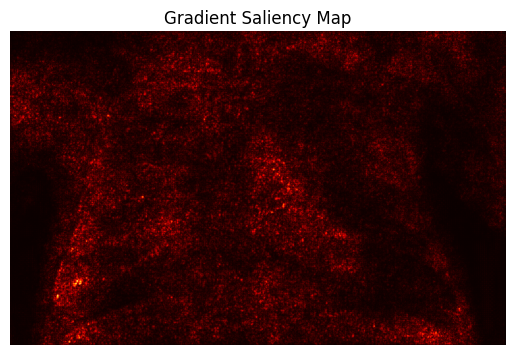

In [ ]:
# %matplotlib inline
saliency_single_list = gradient_saliency_mapping_single(model, sampleGradientImageDataloader)
saliency_single = saliency_single_list[0]
plt.clf()
plt.imshow(saliency_single.squeeze().cpu(), cmap='hot')
plt.axis('off')
plt.title('Gradient Saliency Map')
plt.show()

In [ ]:
def saliency_norm(sal_img_list):
  norm_sal_img_list = []
  for sal_img in sal_img_list:
    norm_sal_img_list.append((sal_img - sal_img.min()) / (sal_img.max() - sal_img.min()))
  return norm_sal_img_list

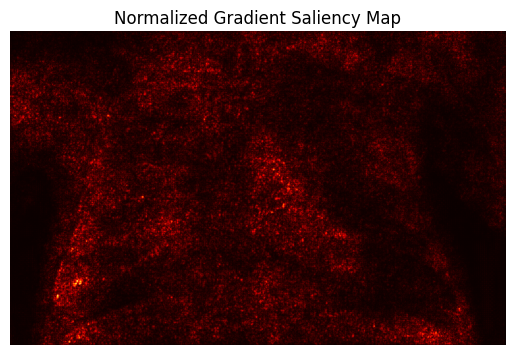

In [ ]:
saliency_norm_list = saliency_norm(saliency_single_list)
saliency_norm_single = saliency_norm_list[0]

plt.imshow(saliency_norm_single.squeeze().cpu(), cmap='hot')
plt.axis('off')
plt.title('Normalized Gradient Saliency Map')
plt.show()

And for bonus we can overlay the saliency map on the original image, nothing too clean to look at but it clearly highlights the bottom portion of the right lung that the model was looking at closely, a few other sections of the right lung of note, and perhaps a slightly concerning amount of focus on the heart.

<Figure size 640x480 with 0 Axes>

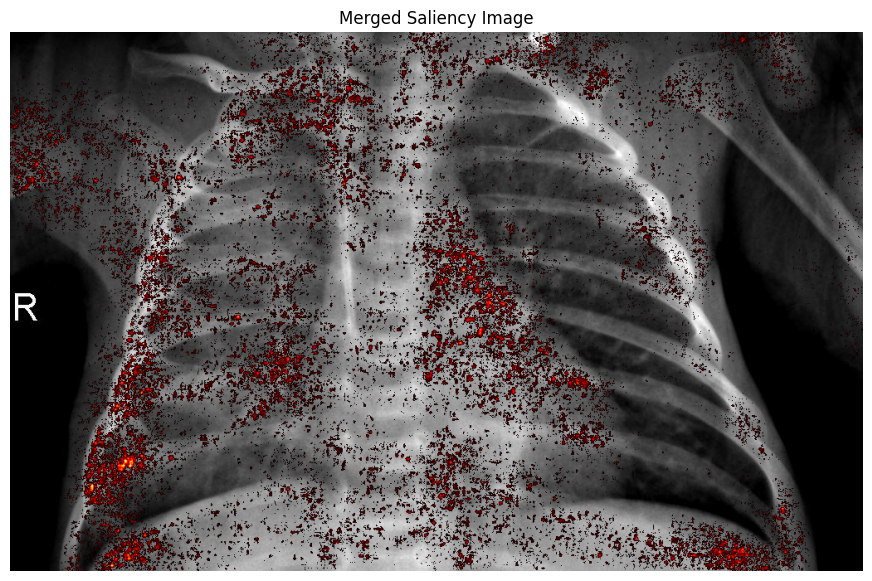

In [ ]:
plt.clf()
show_batch_images_single_saliency(sampleGradientImageDataloader, saliency_single, 1, "Merged Saliency Image", 85)

In [ ]:
# %matplotlib widget
# import matplotlib
# print(matplotlib.get_backend())
show_single_image_saliency_with_slider(sampleGradientImageDataloader, saliency_single, label="Gradient Saliency PNEUMONIA")

FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

In [ ]:
# saliency_20_list = gradient_saliency_mapping(model, salDataLoader)
# saliency_20_sample = saliency_20_list[0]
# saliency_20_norm = saliency_norm(saliency_20_list)
# saliency_20_norm_sample = saliency_20_norm[0]

In [ ]:
def batch_slider_grad(batched_dataLoader, batch_size):
  # Turn the dataloader into an iterator
  batched_dataLoader = iter(batched_dataLoader)
  found_matched_gradient_images = []

  while True:
      try:
          # Grab the next batch
          images, labels = next(batched_dataLoader)

          # Limit to batch_size
          images = images[:batch_size]
          labels = labels[:batch_size]

          # Generate saliency maps for this batch
          saliency_maps = gradient_saliency_mapping(model, [(images, labels)])

          # Show the batch with your function
          show_batch_images_saliency_with_slider([(images, labels)], saliency_maps, k=batch_size, label="Batch", gradientInd=0)

          found_matched_gradient_images.append((saliency_maps, (images, labels)))
          # print(len(found_matched_gradient_images))

      except StopIteration:
          print("Finished all batches.")
          break
  return found_matched_gradient_images

In [ ]:
# show_batch_images_saliency_with_slider(salDataLoader, saliency_20_list, k=5)
gradient_saliency_batches = batch_slider_grad(salDataLoader, 10)

FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

Finished all batches.


# 5.2 GradComp
Now let's try the GradComp saliency map, this one was noted as one of the more successful saliency maps in the paper.

In [ ]:
import sys
import os
from contextlib import contextmanager
#tool for cleaner output when running with hooks

@contextmanager
def suppress_stdout():
    with open(os.devnull, "w") as devnull:
        old_stdout = sys.stdout
        try:
            sys.stdout = devnull
            yield
        finally:
            sys.stdout = old_stdout

In [ ]:
#output
# saliency_loader: saliency data loader (type: torch.utils.data.DataLoader)
def load_data_sal_GradComp(data_path=DATA_PATH):

    '''
    You should add the following transforms (https://pytorch.org/vision/stable/transforms.html):
        1. transforms.RandomResizedCrop: the images should be cropped to 224 x 224
        2. transforms.ToTensor: just to convert data/labels to tensors
    '''
    import torchvision
    import torchvision.datasets as datasets
    import torchvision.transforms as transforms


    folder_path_normal_sal = str(data_path + "/" + "saliency")

    transform_image = transforms.Compose([
        transforms.RandomResizedCrop(size=224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    ])

    sal_dataset = datasets.ImageFolder(folder_path_normal_sal, transform=transform_image)

    sal_loader = torch.utils.data.dataloader.DataLoader(sal_dataset, batch_size=10, shuffle=False)

    return sal_loader

In [ ]:
gradients = []
activations = []
activations_hook_handles = []
gradients_hook_handles = []

transform_image = transforms.Compose([
        transforms.RandomResizedCrop(size=224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    ])
sampleGradCamImageDataset = SingleImageDataset(sampleImagePath, transform=transform)
sampleGradCamImageDataloader = DataLoader(sampleGradCamImageDataset, batch_size=1, shuffle=False)

gradCamSalDataLoader = load_data_sal_GradComp()

def save_gradients_hook(module, grad_input, grad_output):
    gradients.append(grad_output[0])

def save_activations_hook(module, input, output):
    activations.append(output)

# Hook the last convolutional layer (for ResNet it's layer4)
target_layer = model.layer4[-1]
with suppress_stdout():
  act_handle = target_layer.register_forward_hook(save_activations_hook)
  grad_handle = target_layer.register_full_backward_hook(save_gradients_hook)
activations_hook_handles.append(act_handle)
gradients_hook_handles.append(grad_handle)

model.eval()
for batch in sampleGradCamImageDataloader:
    input_tensor = batch.requires_grad_()  # keep computation graph

    gradients.clear()
    activations.clear()

    output = model(input_tensor)
    target_class = output.argmax(dim=1).item()
    score = output[0, target_class]

    model.zero_grad()
    score.backward()

    # ---- Grad-CAM calculation ----
    grad = gradients[0]  # shape: [1, C, H, W]
    act = activations[0]  # shape: [1, C, H, W]

    weights = grad.mean(dim=(2, 3), keepdim=True)  # global avg pool
    gradcam = (weights * act).sum(dim=1, keepdim=True)
    gradcam = torch.relu(gradcam)
    gradcam = torch.nn.functional.interpolate(gradcam, size=(224, 224), mode='bilinear', align_corners=False)
    gradcam = gradcam.squeeze().detach().cpu().numpy()
    gradcam = (gradcam - gradcam.min()) / (gradcam.max() - gradcam.min())

    # visualize or save
    break
#clear hooks
for handle in activations_hook_handles:
    handle.remove()
for handle in gradients_hook_handles:
    handle.remove()

In [ ]:
def extract_single_image(salDataLoader, index):
    dataset_item = salDataLoader.dataset[index]

    if isinstance(dataset_item, tuple):
        if len(dataset_item) == 2:
            image, label = dataset_item
        elif len(dataset_item) == 1:
            image, label = dataset_item[0], None
        else:
            raise ValueError(f"Unexpected dataset item length: {len(dataset_item)}")
    else:
        image, label = dataset_item, None

    # Ensure image has 3 channels (e.g., grayscale -> fake 3-channel RGB)
    if image.ndim == 2:
        # From (H, W) -> (1, H, W)
        image = image.unsqueeze(0)
    if image.shape[0] == 1:
        # Repeat channels if needed
        image = image.repeat(3, 1, 1)

    return image, label

In [ ]:
def gradCam_batch(model, salDataLoader):
  def save_gradients_hook(module, grad_input, grad_output):
    gradients.append(grad_output[0])

  def save_activations_hook(module, input, output):
    activations.append(output)

  target_layer = model.layer4[-1]
  with suppress_stdout():
    act_handle = target_layer.register_forward_hook(save_activations_hook)
    grad_handle = target_layer.register_full_backward_hook(save_gradients_hook)
  activations_hook_handles_local = []
  gradients_hook_handles_local = []
  activations_hook_handles_local.append(act_handle)
  gradients_hook_handles_local.append(grad_handle)
  gradCam_list = []

  model.eval()
  for batch, _ in salDataLoader:
        batch = batch.requires_grad_()

        for i in range(batch.size(0)):  # Loop over batch entries
            input_tensor = batch[i].unsqueeze(0)  # Single input [1, C, H, W]

            gradients.clear()
            activations.clear()

            output = model(input_tensor)  # Forward pass single image
            pred_class = output.argmax(dim=1)  # Predicted class

            model.zero_grad()
            score = output[0, pred_class]
            score.backward()

            # ---- Grad-CAM calculation ----
            grad = gradients[0]  # [1, C, H, W]
            act = activations[0]  # [1, C, H, W]

            weights = grad.mean(dim=(2, 3), keepdim=True)  # [1, C, 1, 1]
            gradcam = (weights * act).sum(dim=1, keepdim=True)  # [1, 1, H, W]
            gradcam = torch.relu(gradcam)
            gradcam = torch.nn.functional.interpolate(gradcam, size=(224, 224), mode='bilinear', align_corners=False)

            gradcam = gradcam.squeeze().detach().cpu().numpy()
            # gradcam = (gradcam - gradcam.min()) / (gradcam.max() - gradcam.min() + 1e-8)

            gradCam_list.append(gradcam)

  #clear hooks
  for handle in activations_hook_handles_local:
      handle.remove()
  for handle in gradients_hook_handles_local:
      handle.remove()
  return gradCam_list

In [ ]:
def batch_slider_gradCam(model, batched_dataLoader, batch_size=10):
    # Turn the dataloader into an iterator
    batched_dataLoader = iter(batched_dataLoader)
    found_gradCam_list = []

    while True:
        try:
            images, labels = next(batched_dataLoader)
            total_in_batch = images.shape[0]

            # Process in chunks of `batch_size`
            for start_idx in range(0, total_in_batch, batch_size):
                end_idx = min(start_idx + batch_size, total_in_batch)

                images_chunk = images[start_idx:end_idx]
                labels_chunk = labels[start_idx:end_idx]

                saliency_maps = gradCam_batch(model, [(images_chunk, labels_chunk)])
                print(labels_chunk)

                show_batch_images_saliency_with_slider(
                    [(images_chunk, labels_chunk)],
                    saliency_maps,
                    k=batch_size,
                    label=f"Batch {start_idx // batch_size + 1}",
                    gradientInd=1
                )
                found_gradCam_list.append((saliency_maps, (images_chunk, labels_chunk)))

        except StopIteration:
            print("Finished all batches.")
            break

    return found_gradCam_list

In [ ]:
show_single_image_saliency_with_slider(sampleGradCamImageDataloader, gradcam, label="GradCAM Salience PNEUMONIA", gradientInd=1)

image shape: (1333, 1582, 3)
saliency shape: (1333, 1582)


FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

In [ ]:
# gradcam_batch_list = gradCam_batch(model, gradCamSalDataLoader)

In [ ]:
found_batch_gradCam_sets = batch_slider_gradCam(model, gradCamSalDataLoader, 10)

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
image shape: (523, 2017, 3)
saliency shape: (523, 2017)


FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
image shape: (523, 2017, 3)
saliency shape: (523, 2017)


FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])
image shape: (523, 2017, 3)
saliency shape: (523, 2017)


FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])
image shape: (523, 2017, 3)
saliency shape: (523, 2017)


FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

Finished all batches.


In [ ]:
show_single_image_from_batch_saliency_with_slider(found_batch_gradCam_sets, batch_index=0, image_index=2, gradientInd=1)

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
image shape: (224, 224, 3)
saliency shape: (224, 224)


FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

In [ ]:
#clear hooks
for handle in activations_hook_handles:
    handle.remove()
for handle in gradients_hook_handles:
    handle.remove()

# 5.3 LRP-ε-Z⁺ or "Layer-wise Relevance Propagation"
The core of this saliency map is applying the LRP formula:

## LRP-ε-Z⁺ Rule

For each neuron $i$ and output neuron $j$, the relevance score is computed as:

$$
R_i = \sum_j \frac{z_{ij}^+}{\sum_i z_{ij}^+ + \epsilon \cdot \text{sign}\left(\sum_i z_{ij}^+\right)} R_j
$$

Where:
- $ z_{ij}^+ = x_i w_{ij}^+ $ : the product of the input and **positive part** of the weight.
- $R_j$ : relevance at layer $j$
- $ \epsilon $ : small positive constant for numerical stability


In [ ]:
transform_image = transforms.Compose([
        transforms.RandomResizedCrop(size=224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    ])
sampleLRPImageDataset = SingleImageDataset(sampleImagePath, transform=transform)
sampleLRPImageDataloader = DataLoader(sampleLRPImageDataset, batch_size=1, shuffle=False)
salDataLoaderLRP = load_data_sal_GradComp()

In [ ]:
def lrp_eps_zplus_linear(layer, x, R, epsilon=1e-6):
    with torch.no_grad():
        w_pos = layer.weight.clamp(min=0)
        z = F.linear(x, w_pos) + epsilon
        s = R / z
        c = F.linear(s, w_pos.t())
        return x * c

In [ ]:
def lrp_eps_zplus_conv(layer, x, y, R, epsilon=1e-6):
    with torch.no_grad():
        w_pos = layer.weight.clamp(min=0)
        z = F.conv2d(x, w_pos, stride=layer.stride, padding=layer.padding) + epsilon * torch.sign(y)
        s = R / z
        c = F.conv_transpose2d(s, w_pos, stride=layer.stride, padding=layer.padding)
        return x * c

In [ ]:
def lrp_batch(model, salDataLoader):
  layer_outputs = {}
  activations_lrp = {}
  lrp_list = []
  forward_hooks = []

  def forward_hook(name):
      def hook(module, input, output):
          print(f"[Hook] Captured {name}")
          activations_lrp[name] = input[0].detach()
          layer_outputs[name] = output.detach()
      return hook

  last_conv_name = None
  first_linear_name = None

  for name, module in model.named_modules():
      if isinstance(module, nn.Conv2d):
          last_conv_name = name  # last conv seen will be kept
      if isinstance(module, nn.Linear) and first_linear_name is None:
          first_linear_name = name

  from torch.nn import AdaptiveAvgPool2d

  for name, module in model.named_modules():
      if isinstance(module, (nn.Conv2d, nn.Linear, AdaptiveAvgPool2d)):
          for_hook = module.register_forward_hook(forward_hook(name))
          forward_hooks.append(for_hook)

  model.eval()

  for batch, labels in salDataLoader:
      input_tensor = batch.requires_grad_()
      activations_lrp.clear()
      layer_outputs.clear()

      output = model(input_tensor)  # shape: (B, num_classes)
      target_classes = output.argmax(dim=1)  # shape: (B,)

      linear_layer = dict(model.named_modules())[first_linear_name]
      linear_input = activations_lrp[first_linear_name]  # shape: (B, features)

      # Start relevance: one per image in the batch
      R = torch.zeros_like(output)

      # Loop over each image in the batch
      for i in range(output.shape[0]):
          target_class = target_classes[i]
          output_score = output[i, target_class].detach()
          print(f"Image {i}: class {target_class.item()} score {output_score.item()}")

          # Set relevance for that image & class
          R[i, target_class] = output_score

      R_flat = lrp_eps_zplus_linear(linear_layer, linear_input, R)
      # Broadcast flat relevance across spatial dimensions
      conv_layer = dict(model.named_modules())[last_conv_name]
      conv_input = activations_lrp[last_conv_name]
      conv_output = layer_outputs[last_conv_name]
      B, C, H, W = conv_output.shape
      R_conv = R_flat.view(B, C, 1, 1).expand(B, C, H, W)

      conv_layer = dict(model.named_modules())[last_conv_name]

      R = lrp_eps_zplus_conv(conv_layer, conv_input, conv_output, R_conv)
      saliencyLRP = R.sum(dim=1)  # shape: (B, H, W)
      saliencyLRP = saliencyLRP.cpu().numpy()
      saliencyLRP_norm = (saliencyLRP - saliencyLRP.min(axis=(1,2), keepdims=True)) / (saliencyLRP.max(axis=(1,2), keepdims=True) - saliencyLRP.min(axis=(1,2), keepdims=True) + 1e-8)
      lrp_list.append(saliencyLRP_norm)
  for handle in forward_hooks:
      handle.remove()
  return lrp_list

In [ ]:
# lrp_saliency_list = lrp_batch(model, salDataLoaderLRP)

In [ ]:
def batch_slider_lrp(model, batched_dataLoader, batch_size=10):
    # Turn the dataloader into an iterator
    batched_dataLoader = iter(batched_dataLoader)
    found_lrp_list = []

    while True:
        try:
            images, labels = next(batched_dataLoader)
            total_in_batch = images.shape[0]

            # Process in chunks of `batch_size`
            for start_idx in range(0, total_in_batch, batch_size):
                end_idx = min(start_idx + batch_size, total_in_batch)

                images_chunk = images[start_idx:end_idx]
                labels_chunk = labels[start_idx:end_idx]

                saliency_maps = lrp_batch(model, [(images_chunk, labels_chunk)])
                # saliency_maps is a list with 1 item, which is (B, H, W)
                batch_saliency = saliency_maps[0]  # shape: (B, H, W)
                saliency_maps_list = [batch_saliency[i] for i in range(batch_saliency.shape[0])]
                # print(saliency_maps_list)
                # print(len(saliency_maps_list[0]))

                show_batch_images_saliency_with_slider_lrp(
                    [(images_chunk, labels_chunk)],
                    saliency_maps_list,
                    k=batch_size,
                    label=f"Batch {start_idx // batch_size + 1}",
                    gradientInd=2
                )
                found_lrp_list.append((saliency_maps_list, (images_chunk, labels_chunk)))

        except StopIteration:
            print("Finished all batches.")
            break

    return found_lrp_list

In [ ]:
found_lrp_batch_list = batch_slider_lrp(model, salDataLoaderLRP)

[Hook] Captured conv1
[Hook] Captured layer1.0.conv1
[Hook] Captured layer1.0.conv2
[Hook] Captured layer1.1.conv1
[Hook] Captured layer1.1.conv2
[Hook] Captured layer2.0.conv1
[Hook] Captured layer2.0.conv2
[Hook] Captured layer2.0.downsample.0
[Hook] Captured layer2.1.conv1
[Hook] Captured layer2.1.conv2
[Hook] Captured layer3.0.conv1
[Hook] Captured layer3.0.conv2
[Hook] Captured layer3.0.downsample.0
[Hook] Captured layer3.1.conv1
[Hook] Captured layer3.1.conv2
[Hook] Captured layer4.0.conv1
[Hook] Captured layer4.0.conv2
[Hook] Captured layer4.0.downsample.0
[Hook] Captured layer4.1.conv1
[Hook] Captured layer4.1.conv2
[Hook] Captured avgpool
[Hook] Captured fc
Image 0: class 0 score 0.4546322822570801
Image 1: class 0 score 0.3118264973163605
Image 2: class 0 score 0.4092492163181305
Image 3: class 0 score -0.431970477104187
Image 4: class 0 score 0.6078192591667175
Image 5: class 0 score 1.0892903804779053
Image 6: class 0 score -0.04162883386015892
Image 7: class 0 score 0.0855

FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

[Hook] Captured conv1
[Hook] Captured layer1.0.conv1
[Hook] Captured layer1.0.conv2
[Hook] Captured layer1.1.conv1
[Hook] Captured layer1.1.conv2
[Hook] Captured layer2.0.conv1
[Hook] Captured layer2.0.conv2
[Hook] Captured layer2.0.downsample.0
[Hook] Captured layer2.1.conv1
[Hook] Captured layer2.1.conv2
[Hook] Captured layer3.0.conv1
[Hook] Captured layer3.0.conv2
[Hook] Captured layer3.0.downsample.0
[Hook] Captured layer3.1.conv1
[Hook] Captured layer3.1.conv2
[Hook] Captured layer4.0.conv1
[Hook] Captured layer4.0.conv2
[Hook] Captured layer4.0.downsample.0
[Hook] Captured layer4.1.conv1
[Hook] Captured layer4.1.conv2
[Hook] Captured avgpool
[Hook] Captured fc
Image 0: class 0 score -0.4160822927951813
Image 1: class 0 score 0.2626950442790985
Image 2: class 0 score 0.4520285129547119
Image 3: class 0 score 0.0677235871553421
Image 4: class 0 score 1.1516468524932861
Image 5: class 0 score 0.9057736396789551
Image 6: class 0 score 0.5321759581565857
Image 7: class 0 score 0.24932

FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

[Hook] Captured conv1
[Hook] Captured layer1.0.conv1
[Hook] Captured layer1.0.conv2
[Hook] Captured layer1.1.conv1
[Hook] Captured layer1.1.conv2
[Hook] Captured layer2.0.conv1
[Hook] Captured layer2.0.conv2
[Hook] Captured layer2.0.downsample.0
[Hook] Captured layer2.1.conv1
[Hook] Captured layer2.1.conv2
[Hook] Captured layer3.0.conv1
[Hook] Captured layer3.0.conv2
[Hook] Captured layer3.0.downsample.0
[Hook] Captured layer3.1.conv1
[Hook] Captured layer3.1.conv2
[Hook] Captured layer4.0.conv1
[Hook] Captured layer4.0.conv2
[Hook] Captured layer4.0.downsample.0
[Hook] Captured layer4.1.conv1
[Hook] Captured layer4.1.conv2
[Hook] Captured avgpool
[Hook] Captured fc
Image 0: class 0 score -0.26223599910736084
Image 1: class 1 score -0.6962157487869263
Image 2: class 0 score 0.3283047080039978
Image 3: class 0 score -0.8011549115180969
Image 4: class 1 score 0.04135727882385254
Image 5: class 1 score 0.4704713225364685
Image 6: class 0 score -0.4264655113220215
Image 7: class 0 score -0

FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

[Hook] Captured conv1
[Hook] Captured layer1.0.conv1
[Hook] Captured layer1.0.conv2
[Hook] Captured layer1.1.conv1
[Hook] Captured layer1.1.conv2
[Hook] Captured layer2.0.conv1
[Hook] Captured layer2.0.conv2
[Hook] Captured layer2.0.downsample.0
[Hook] Captured layer2.1.conv1
[Hook] Captured layer2.1.conv2
[Hook] Captured layer3.0.conv1
[Hook] Captured layer3.0.conv2
[Hook] Captured layer3.0.downsample.0
[Hook] Captured layer3.1.conv1
[Hook] Captured layer3.1.conv2
[Hook] Captured layer4.0.conv1
[Hook] Captured layer4.0.conv2
[Hook] Captured layer4.0.downsample.0
[Hook] Captured layer4.1.conv1
[Hook] Captured layer4.1.conv2
[Hook] Captured avgpool
[Hook] Captured fc
Image 0: class 0 score -0.531416118144989
Image 1: class 1 score 0.21993136405944824
Image 2: class 0 score 0.8262479901313782
Image 3: class 0 score 0.9376372694969177
Image 4: class 0 score 1.02726149559021
Image 5: class 0 score 0.10181808471679688
Image 6: class 0 score 0.2011326551437378
Image 7: class 1 score -0.05025

FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

Finished all batches.


In [ ]:
layer_outputs_2 = {}
activations_lrp_2 = {}
for_hooks = []

def forward_hook(name):
    def hook(module, input, output):
        # print(f"[Hook] Captured {name}")
        activations_lrp_2[name] = input[0].detach()
        layer_outputs_2[name] = output.detach()
    return hook

last_conv_name_2 = None
first_linear_name_2 = None

for name, module in model.named_modules():
    if isinstance(module, nn.Conv2d):
        last_conv_name_2 = name  # last conv seen will be kept
    if isinstance(module, nn.Linear) and first_linear_name_2 is None:
        first_linear_name_2 = name

from torch.nn import AdaptiveAvgPool2d

for name, module in model.named_modules():
    if isinstance(module, (nn.Conv2d, nn.Linear, AdaptiveAvgPool2d)):
        for_hook = module.register_forward_hook(forward_hook(name))
        for_hooks.append(for_hook)

In [ ]:
model.eval()

for batch in sampleLRPImageDataloader:  # assume batch size = 1
    input_tensor_2 = batch.requires_grad_()
    activations_lrp_2.clear()
    layer_outputs_2.clear()

    output_2 = model(input_tensor_2)
    target_class_2 = output_2.argmax(dim=1).item()
    break  # use just one image

In [ ]:
linear_layer_2 = dict(model.named_modules())[first_linear_name_2]
linear_input_2 = activations_lrp_2[first_linear_name_2]
output_score_2 = output[0, target_class].detach()

# Start relevance: only the predicted class
R = torch.zeros_like(output)
R[0, target_class] = output_score_2

In [ ]:
R_flat_2 = lrp_eps_zplus_linear(linear_layer_2, linear_input_2, R)

In [ ]:
conv_output_2 = layer_outputs_2[last_conv_name_2]
conv_input_2 = activations_lrp_2[last_conv_name_2]

# Get conv output shape: [1, C, H, W]
_, C, H, W = layer_outputs_2[last_conv_name_2].shape

# Broadcast flat relevance across spatial dimensions
R_conv_2 = R_flat_2.view(1, C, 1, 1).expand(1, C, H, W)

In [ ]:
conv_layer_2 = dict(model.named_modules())[last_conv_name_2]

R_2 = lrp_eps_zplus_conv(conv_layer_2, conv_input_2, conv_output_2, R_conv_2)

In [ ]:
saliencyLRP_2 = R_2.squeeze().sum(dim=0).cpu().numpy()
saliencyLRP_norm_2 = (saliencyLRP_2 - saliencyLRP_2.min()) / (saliencyLRP_2.max() - saliencyLRP_2.min() + 1e-8)

In [ ]:
show_single_image_saliency_with_slider(sampleLRPImageDataloader, saliencyLRP_norm_2, label="LRP Salience PNEUMONIA", gradientInd=2)

image shape: (650, 1028, 3)
saliency shape: (650, 1028)


FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

In [ ]:
show_single_image_from_batch_saliency_with_slider_lrp(found_lrp_batch_list, 2, 2, gradientInd=2)

10
10
10
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])
7
image shape: (224, 224, 3)
saliency shape: (224, 224)


FloatSlider(value=0.3, continuous_update=False, description='Alpha', max=1.0, step=0.01)

Output()

In [ ]:
#clear hooks
for handle in activations_hook_handles:
    handle.remove()
for handle in gradients_hook_handles:
    handle.remove()
for handle in for_hooks:
    handle.remove()

# 6 Experimenting with Region Relevancy Scores
For this section we will dive into adding region relevancy grouping and scoring to explore the core question in the paper: "Do Region-based saliency explanations distinguish unaffected and syndromic
images?"

For the purposes of our pneumonia dataset we will break it down into 3 regions: lungs, heart, spine. These should have varying relevance to what the deep learning model is paying attention to for pneumonia diagnoses.

# 6.1 Define Regions and Calculate Scores
For simplicity in the chest x-rays we are going to define regions of even verticle slices, illustrating the left, middle, and right side of the x-ray.

In [ ]:
import numpy as np

def get_region_masks(h, w, num_rows=1, num_cols=3):
    """Returns a list of binary masks, each for one region in a grid."""
    masks = []
    row_height = h // num_rows
    col_width = w // num_cols
    for i in range(num_rows):
        for j in range(num_cols):
            mask = np.zeros((h, w), dtype=bool)
            y_start = i * row_height
            y_end = (i + 1) * row_height if i < num_rows - 1 else h
            x_start = j * col_width
            x_end = (j + 1) * col_width if j < num_cols - 1 else w
            mask[y_start:y_end, x_start:x_end] = True
            masks.append(mask)
    return masks

In [ ]:
def compute_region_scores(saliency_map, region_masks, agg_fn='mean'):
    """
    saliency_map: (H, W) numpy array.
    region_masks: list of boolean masks (same shape as saliency_map).
    agg_fn: 'mean', 'sum', or 'max'.
    """
    scores = []
    for mask in region_masks:
        region_values = saliency_map[mask]
        if agg_fn == 'mean':
            score = np.mean(region_values)
        elif agg_fn == 'sum':
            score = np.sum(region_values)
        elif agg_fn == 'max':
            score = np.max(region_values)
        else:
            raise ValueError(f"Unknown agg_fn: {agg_fn}")
        scores.append(score)
    return scores

In [ ]:
# Example: Saliency map of size 224x224, divided into 3 vertical slices
H, W = 224, 224
batch_index = 0
image_index = 0
gradient_saliency_maps, (images, labels) = gradient_saliency_batches[batch_index]
gradient_saliency_map = gradient_saliency_maps[image_index].detach().cpu().numpy()

region_masks = get_region_masks(H, W, num_rows=1, num_cols=3)  # 3 masks

region_scores = compute_region_scores(gradient_saliency_map, region_masks, agg_fn='mean')

print(region_scores)  # Output: list of 3 numbers, one per region
print(labels[image_index])

[np.float32(0.1606821), np.float32(0.22521053), np.float32(0.15900595)]
tensor(0)


In [ ]:
def batch_process_saliency_scores(saliency_maps, labels, region_masks):
  all_scores = []
  # print(len(saliency_maps))
  for saliency_map, label in zip(saliency_maps, labels):
      if isinstance(saliency_map, torch.Tensor):
        saliency_map = saliency_map.detach().cpu().numpy()
      region_scores = compute_region_scores(saliency_map, region_masks)
      all_scores.append({
          'scores': region_scores,
          'label': label.item()
      })
  return all_scores

In [ ]:
def flatten_batches(batched_list):
  all_saliency_maps = []
  all_images = []
  all_labels = []

  for saliency_maps, (images, labels) in batched_list:
      all_saliency_maps.extend(saliency_maps)
      all_images.extend(images)
      all_labels.extend(labels)

  return all_saliency_maps, all_images, all_labels

In [ ]:
gradient_saliency_all_maps, gradient_all_images, gradient_all_labels = flatten_batches(gradient_saliency_batches)
gradient_region_scores = batch_process_saliency_scores(gradient_saliency_all_maps, gradient_all_labels, region_masks)
print(gradient_region_scores)

[{'scores': [np.float32(0.1606821), np.float32(0.22521053), np.float32(0.15900595)], 'label': 0}, {'scores': [np.float32(0.15596329), np.float32(0.19307138), np.float32(0.12940338)], 'label': 0}, {'scores': [np.float32(0.2639122), np.float32(0.2118799), np.float32(0.0966528)], 'label': 0}, {'scores': [np.float32(0.19148816), np.float32(0.3293607), np.float32(0.18434593)], 'label': 0}, {'scores': [np.float32(0.25677618), np.float32(0.3053966), np.float32(0.17966366)], 'label': 0}, {'scores': [np.float32(0.17371911), np.float32(0.21119317), np.float32(0.1412763)], 'label': 0}, {'scores': [np.float32(0.20884645), np.float32(0.2617446), np.float32(0.12250685)], 'label': 0}, {'scores': [np.float32(0.20017567), np.float32(0.17956506), np.float32(0.19021012)], 'label': 0}, {'scores': [np.float32(0.15673229), np.float32(0.24691288), np.float32(0.25331992)], 'label': 0}, {'scores': [np.float32(0.23669684), np.float32(0.22292903), np.float32(0.06686701)], 'label': 0}, {'scores': [np.float32(0.23

In [ ]:
from collections import defaultdict

def group_region_scores(all_results):
  num_regions = len(all_results[0]['scores'])

  # Create grouped lists
  grouped_scores = {
      0 : defaultdict(list),
      1 : defaultdict(list)
  }

  for result in all_results:
      label = result['label']
      for region_idx in range(num_regions):
          grouped_scores[label][region_idx].append(result['scores'][region_idx])
  return grouped_scores

In [ ]:
grouped_gradient_region_scores = group_region_scores(gradient_region_scores)
print(grouped_gradient_region_scores)

{0: defaultdict(<class 'list'>, {0: [np.float32(0.1606821), np.float32(0.15596329), np.float32(0.2639122), np.float32(0.19148816), np.float32(0.25677618), np.float32(0.17371911), np.float32(0.20884645), np.float32(0.20017567), np.float32(0.15673229), np.float32(0.23669684), np.float32(0.23517421), np.float32(0.13051386), np.float32(0.12515599), np.float32(0.22902386), np.float32(0.26665857), np.float32(0.13905106), np.float32(0.1441215), np.float32(0.17832907), np.float32(0.29981014), np.float32(0.10525748)], 1: [np.float32(0.22521053), np.float32(0.19307138), np.float32(0.2118799), np.float32(0.3293607), np.float32(0.3053966), np.float32(0.21119317), np.float32(0.2617446), np.float32(0.17956506), np.float32(0.24691288), np.float32(0.22292903), np.float32(0.33831233), np.float32(0.1930326), np.float32(0.20836118), np.float32(0.18387878), np.float32(0.17751801), np.float32(0.22144693), np.float32(0.2129986), np.float32(0.21971703), np.float32(0.24802552), np.float32(0.16296215)], 2: [np

# 6.2 Statistical Testing
Now that we have computed region based saliency scores across our gradient saliency maps, lets run some statistics on those scores and see if they have any relevance.

In [ ]:
from scipy.stats import shapiro, levene, ttest_ind, mannwhitneyu

def compute_region_statistics(grouped_scores, num_regions):
  # Store results
  stats_results = []

  for region_idx in range(num_regions):
      # Get scores
      scores_unaffected = grouped_scores[0][region_idx]
      scores_syndromic = grouped_scores[1][region_idx]

      # Normality tests
      shapiro_unaffected = shapiro(scores_unaffected)
      shapiro_syndromic = shapiro(scores_syndromic)

      normal_unaffected = shapiro_unaffected.pvalue > 0.05
      normal_syndromic = shapiro_syndromic.pvalue > 0.05

      # Variance equality test
      levene_test = levene(scores_unaffected, scores_syndromic)
      equal_variances = levene_test.pvalue > 0.05

      # Decide test
      if normal_unaffected and normal_syndromic and equal_variances:
          test_used = 't-test'
          stat_test = ttest_ind(scores_unaffected, scores_syndromic, equal_var=True)
      else:
          test_used = 'Mann-Whitney U'
          stat_test = mannwhitneyu(scores_unaffected, scores_syndromic, alternative='two-sided')

      # Store results
      stats_results.append({
          'region': region_idx,
          'test_used': test_used,
          'p_value': stat_test.pvalue,
          'shapiro_unaffected_p': shapiro_unaffected.pvalue,
          'shapiro_syndromic_p': shapiro_syndromic.pvalue,
          'levene_p': levene_test.pvalue
      })
  return stats_results

In [ ]:
def bonferonni_correction(num_regions, stats_results):
  alpha = 0.05  # Or your chosen significance level
  adjusted_alpha = alpha / num_regions

  # Check significance
  for result in stats_results:
      is_significant = result['p_value'] < adjusted_alpha
      print(f"Region {result['region']}: {result['test_used']} p={result['p_value']:.4f} "
            f"(Significant after correction? {'YES' if is_significant else 'NO'})")

In [ ]:
found_stats = compute_region_statistics(grouped_gradient_region_scores, 3)
print(found_stats)
bonferonni_correction(3, found_stats)

[{'region': 0, 'test_used': 't-test', 'p_value': np.float64(0.27663242914873426), 'shapiro_unaffected_p': np.float64(0.6290563830731961), 'shapiro_syndromic_p': np.float64(0.539308195892471), 'levene_p': np.float64(0.26120994850563806)}, {'region': 1, 'test_used': 'Mann-Whitney U', 'p_value': np.float64(0.1805773768084653), 'shapiro_unaffected_p': np.float64(0.020908545723727454), 'shapiro_syndromic_p': np.float64(0.15789628858353305), 'levene_p': np.float64(0.002740534842381833)}, {'region': 2, 'test_used': 'Mann-Whitney U', 'p_value': np.float64(0.0013485824363168647), 'shapiro_unaffected_p': np.float64(0.3711046619445989), 'shapiro_syndromic_p': np.float64(0.8230343017763224), 'levene_p': np.float64(0.03358750105732999)}]
Region 0: t-test p=0.2766 (Significant after correction? NO)
Region 1: Mann-Whitney U p=0.1806 (Significant after correction? NO)
Region 2: Mann-Whitney U p=0.0013 (Significant after correction? YES)


# 6.3 Regions with GradCAM
Lets try again with the GradCAM saliency results and see if things are a bit more statistically significant.

In [ ]:
# found_batch_gradCam_sets
gradCam_saliency_all_maps, gradCam_all_images, gradCam_all_labels = flatten_batches(found_batch_gradCam_sets)
gradCam_region_scores = batch_process_saliency_scores(gradCam_saliency_all_maps, gradCam_all_labels, region_masks)
grouped_gradCam_region_scores = group_region_scores(gradCam_region_scores)
found_stats_gradCam = compute_region_statistics(grouped_gradCam_region_scores, 3)
print(found_stats_gradCam)
bonferonni_correction(3, found_stats_gradCam)

[{'region': 0, 'test_used': 'Mann-Whitney U', 'p_value': np.float64(0.7149287280368875), 'shapiro_unaffected_p': np.float64(0.039409704983323725), 'shapiro_syndromic_p': np.float64(0.06642939688245425), 'levene_p': np.float64(0.2424349078899432)}, {'region': 1, 'test_used': 'Mann-Whitney U', 'p_value': np.float64(0.6167746941014318), 'shapiro_unaffected_p': np.float64(0.012882968022953769), 'shapiro_syndromic_p': np.float64(0.15591631341151824), 'levene_p': np.float64(0.38390320962063695)}, {'region': 2, 'test_used': 'Mann-Whitney U', 'p_value': np.float64(0.37202063018976905), 'shapiro_unaffected_p': np.float64(1.0204885069205963e-06), 'shapiro_syndromic_p': np.float64(0.0002684141420700057), 'levene_p': np.float64(0.5471543814907638)}]
Region 0: Mann-Whitney U p=0.7149 (Significant after correction? NO)
Region 1: Mann-Whitney U p=0.6168 (Significant after correction? NO)
Region 2: Mann-Whitney U p=0.3720 (Significant after correction? NO)


# 6.4 Regions with LRP
And to finish it up lets look at our third saliency mapping function and try the statistics with LRP.

In [ ]:
H, W = 7, 7

region_masks_lrp = get_region_masks(H, W, num_rows=1, num_cols=3)  # 3 masks
lrp_saliency_all_maps, lrp_all_images, lrp_all_labels = flatten_batches(found_lrp_batch_list)
lrp_region_scores = batch_process_saliency_scores(lrp_saliency_all_maps, lrp_all_labels, region_masks_lrp)
grouped_lrp_region_scores = group_region_scores(lrp_region_scores)
found_stats_lrp = compute_region_statistics(grouped_lrp_region_scores, 3)
print(found_stats_lrp)
bonferonni_correction(3, found_stats_lrp)

[{'region': 0, 'test_used': 't-test', 'p_value': np.float64(0.4891780549859307), 'shapiro_unaffected_p': np.float64(0.2783568943008058), 'shapiro_syndromic_p': np.float64(0.5942394972885512), 'levene_p': np.float64(0.6304065253512412)}, {'region': 1, 'test_used': 't-test', 'p_value': np.float64(0.05470379079171632), 'shapiro_unaffected_p': np.float64(0.11523308368454727), 'shapiro_syndromic_p': np.float64(0.5707552384251744), 'levene_p': np.float64(0.5020156344042991)}, {'region': 2, 'test_used': 'Mann-Whitney U', 'p_value': np.float64(0.42488347368209856), 'shapiro_unaffected_p': np.float64(0.6247207261935002), 'shapiro_syndromic_p': np.float64(0.3900768538943292), 'levene_p': np.float64(0.015955582884471728)}]
Region 0: t-test p=0.4892 (Significant after correction? NO)
Region 1: t-test p=0.0547 (Significant after correction? NO)
Region 2: Mann-Whitney U p=0.4249 (Significant after correction? NO)
